# cesm Rainfall by Event Type

In [1]:
#import my functions
import utils._modelDefinitions as _model
import utils._indexDefinitions as _index
from utils.timePeriod import averageForTimePeriod

%run "utils/compound.ipynb"

In [2]:
import xarray
import matplotlib.pyplot as plt
import numpy
import pandas

import cartopy.crs as ccrs
import matplotlib.pyplot as plt

%matplotlib inline

In [3]:
nEvents = dict()

# Import Events

In [4]:
firePos=xarray.open_dataset('results/cesmFirePos.nc')

fireNeg=xarray.open_dataset('results/cesmFireNeg.nc')

And import warm season rainfall

In [5]:
rainfallXr = xarray.open_dataset('results/cesmPrecAnoms.nc')
tempXr = xarray.open_dataset('results/cesmTsAnoms.nc')

# Some functions

In [6]:
def plotAnom(da, ax):


    
    #set contour intervals and colours
    #rainfall
    if da.name=='precAnom':
        precContours=numpy.arange(-2,2.01,0.4)
        cmap='BrBG'
    #temp
    elif da.name=='tsAnom':
        precContours=numpy.arange(-3,4,0.5)
        cmap='coolwarm'
    
    #do the plotting
    cs=plt.contourf(da.lon, da.lat, da.values, precContours, 
                    transform=ccrs.PlateCarree(), cmap=cmap, extend='both')
    ax.coastlines(color='black')
    
    gl=ax.gridlines(draw_labels=True, linewidth=1, color='gray', alpha=0.5, linestyle=':')
    gl.top_labels=False
    gl.left_labels=False
    
        #bottom legend
    cbar=plt.colorbar(orientation='horizontal', fraction=0.05, pad=0.05)
    
    #rainfall
    if da.name=='precAnom':
        cbar.set_label('Warm Season Anomaly (mm/day)')
    #temp
    elif da.name=='tsAnom':
        cbar.set_label('Mean Anomaly(C)')
    


In [7]:
def multiPlotter(da, mask, indeces, filename):
    
    years=[850,1850,2005,2100]
    #Decide how many rows we are going to have
    if da.where(mask['all3'], drop=True).year[-1]>2005:
        lenYears=3
    else:
        lenYears=2
     
    lenIndeces=len(indeces)
    
    fig = plt.figure(figsize=(10*lenIndeces,8*lenYears))
    
    #for each row
    for iGroup in range(0,lenYears):

        #for each column
        for i in range(0,lenIndeces):
            
            #make a sub plot
            ax=fig.add_subplot(lenYears, #how many columns
                       lenIndeces, #how many rows
                       i+1+iGroup*lenIndeces, # index
                       projection=ccrs.Miller(central_longitude=120))
              #years to plot
            plotCond = mask[indeces[i]].sel(year=slice(years[iGroup],years[iGroup+1]))
                
            toPlot=da.where(plotCond).mean(['year','experiment'])

            nEvents = da.where(plotCond).isel(lon=0,lat=0).count().values
            
            plotAnom(toPlot, ax)

            ax.text(0.01,0.01,"n="+str(nEvents), transform=ax.transAxes, fontsize=22)
                            
            #in the first column, put a y-label
            if i==0:
                ax.text(-0.1, 0.5,  #xy relative to bottom left of axis
                        str(years[iGroup])+'-'+str(years[iGroup+1]), #yearRange
                        rotation='vertical', transform=ax.transAxes, 
                        verticalalignment='center', fontsize=30)
            
            #in the first row put a heading
            if iGroup ==0 :
                ax.set_title('Mean ' + da.name +' anomoly with ' + indeces[i] + ' event',
                             fontsize=22)
                
    plt.savefig(filename)
    plt.show()

# Rainfall for fire-pos individual events

Mean rainfall anomaly for all models with one event

In [8]:
#experiments to plot
eSet=_model.cesmFullForcings

#The no firePos event
noEventXr=(firePos.nEvents==0)
noEventXr.name='noFirePosEvent'

#the absence of events
nothingXr=noEventXr&(fireNeg.nEvents==0)
nothingXr.name='noEvents'

#The single index only event
singleEventsXr=(firePos[firePos.indeces]==True)&(firePos.nEvents==1)

#The compound events
compoundEventsXr=(firePos[[*firePos.pairs, 'all3']]==True)

#Put all those events in one xr
maskXr=xarray.merge([nothingXr, noEventXr, singleEventsXr, compoundEventsXr])

#List of events to plot
eventsList=['noEvents', 'noFirePosEvent', *firePos.indeces, *firePos.pairs, 'all3']

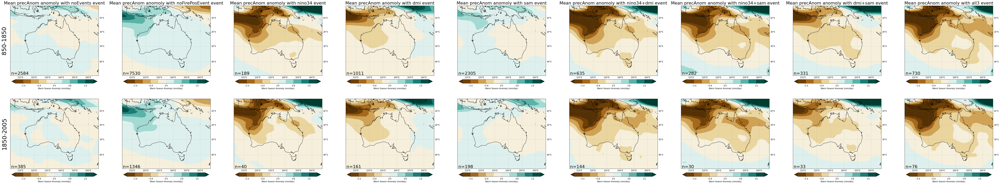

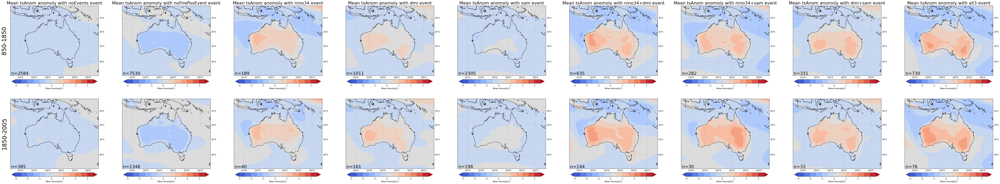

In [9]:
# rainfall plots, fire Pos
multiPlotter(
    rainfallXr.precAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/firePosPrec.png'
)


multiPlotter(
    tempXr.tsAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList, 
    'results/cesmImpactFigures/firePosTemp.png'
)

/Users/ajs/opt/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/Users/ajs/opt/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


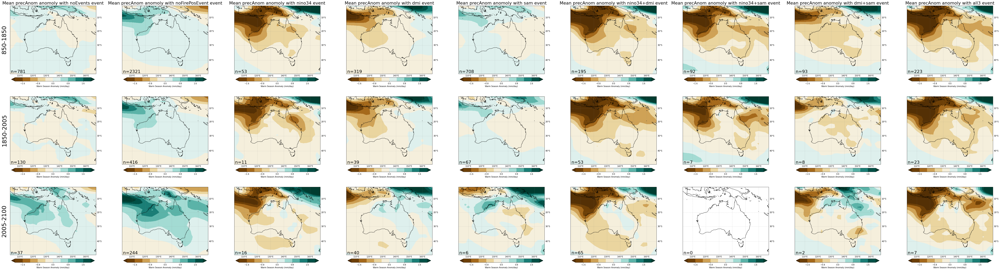

/Users/ajs/opt/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1494: UserWarning: Warning: converting a masked element to nan.
  self.zmax = float(z.max())
/Users/ajs/opt/anaconda3/lib/python3.8/site-packages/matplotlib/contour.py:1495: UserWarning: Warning: converting a masked element to nan.
  self.zmin = float(z.min())


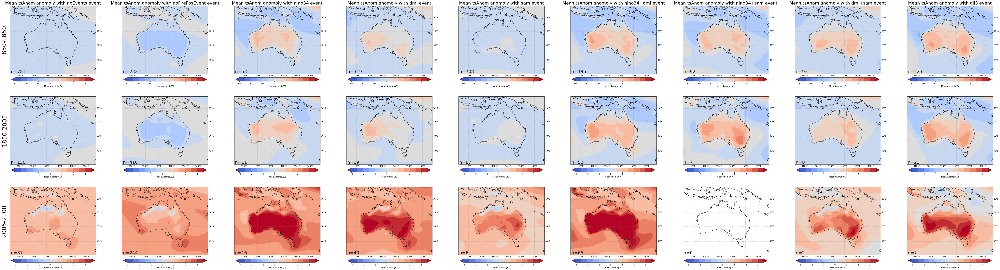

In [10]:
eSet=_model.cesmRcp85

multiPlotter(
    rainfallXr.precAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/firePosRcp85Prec.png' #output File
)

multiPlotter(
    tempXr.tsAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/firePosRcp85Temp.png'
)

# And again for Fire Neg

In [11]:
eSet=_model.cesmFullForcings

noEventXr=(fireNeg.nEvents==0)
noEventXr.name='noFireNegEvent'

nothingXr=noEventXr&(firePos.nEvents==0)
nothingXr.name='noEvents'

singleEventsXr=(fireNeg[fireNeg.indeces]==True)&(fireNeg.nEvents==1)

compoundEventsXr=(fireNeg[[*fireNeg.pairs, 'all3']]==True)

maskXr=xarray.merge([nothingXr, noEventXr, singleEventsXr, compoundEventsXr])

eventsList=['noEvents', 'noFireNegEvent', *fireNeg.indeces, *fireNeg.pairs, 'all3']

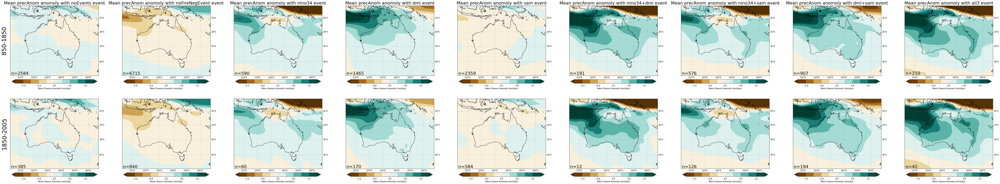

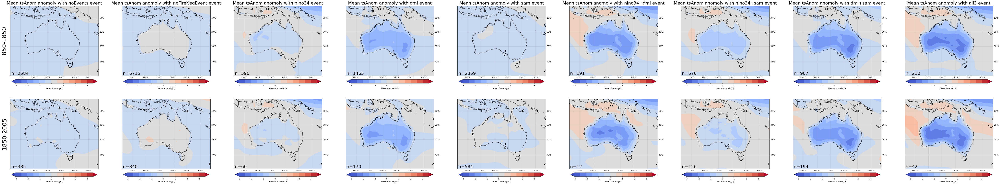

In [12]:
multiPlotter(
    rainfallXr.precAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/fireNegPrec.png'
)


multiPlotter(
    tempXr.tsAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList, 
    'results/cesmImpactFigures/fireNegTemp.png'
)

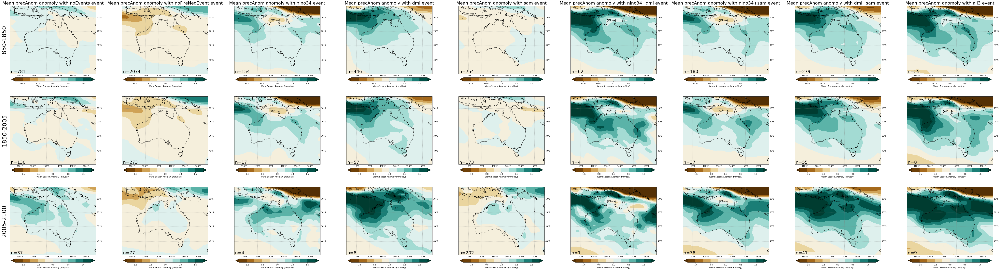

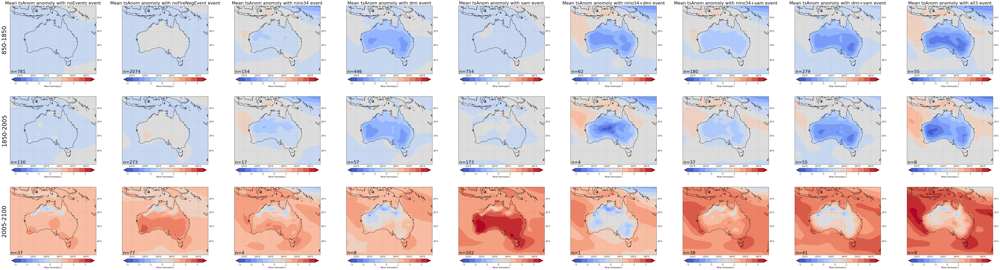

In [13]:
eSet=_model.cesmRcp85


multiPlotter(
    rainfallXr.precAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/fireNegRcp85Prec.png'
)

multiPlotter(
    tempXr.tsAnom.sel(experiment=eSet, drop=True), 
    maskXr, 
    eventsList,
    'results/cesmImpactFigures/fireNegRcp85Temp.png'
)